In [1]:
import torch
import json
from data.data_loader_multigraph import GMDataset, get_dataloader
from torch.utils.data import DataLoader, Subset, DistributedSampler
from utils.config import cfg
from utils.utils import update_params_from_cmdline, compute_grad_norm
from easydict import EasyDict 

c:\Users\antom\Documents\HHU\Thesis\ar-NMT\NormMatchTrans\data\pascal_voc.py:368: SyntaxWarning: invalid escape sequence '\c'
  """


## Test DataLoader using WillowObject dataset, BATCH_SIZE=8, NUM_GRAPH=2

In [2]:
cfg = dict()

with open('./experiments/voc_basic.json') as f:
    cfg = json.load(f)


def dict_to_easydict(d):
    if isinstance(d, dict):
        return EasyDict({k: dict_to_easydict(v) for k, v in d.items()})
    return d

cfg = dict_to_easydict(cfg)
print(cfg)

world_size = 0

torch.manual_seed(cfg.RANDOM_SEED)

{'BATCH_SIZE': 8, 'DATASET_NAME': 'WillowObject', 'exclude_willow_classes': False, 'EVAL': {'SAMPLES': 1000, 'num_graphs_in_matching_instance': 2}, 'SPLINE_CNN': {'input_features': 1024, 'output_features': 648}, 'Matching_TF': {'n_head': 12, 'n_encoder': 4, 'n_decoder': 4, 'd_model': 648, 'nGPT_mlp_hidden_mult': 6, 'activation': 'relu', 'batch_norm': True, 'global_feat': True, 'pos_encoding': False, 'n_lap_EigVec': 8}, 'train_sampling': 'intersection', 'eval_sampling': 'intersection', 'save_checkpoint': True, 'RANDOM_SEED': 123, 'warmstart_path': None, 'TRAIN': {'EPOCH_ITERS': 2000, 'LR': 0.0005, 'lr_schedule': 'long_halving4', 'clip_norm': 0, 'weight_decay': 0, 'num_graphs_in_matching_instance': 2, 'random_swap': False, 'AR': True, 'temperature': 0.1, 'rince_q': 0.5, 'rince_lambda': 0.025}, 'STATISTIC_STEP': 1, 'TRACK_GRAD_NORM': False, 'visualize': False, 'visualization_params': {'reduced_vis': True}, 'evaluate_only': False, 'model_dir': './results/voc_basic/matchAR_corrected_mask', 

In [3]:
dataset_len = {"train": cfg.TRAIN.EPOCH_ITERS * cfg.BATCH_SIZE, "test": cfg.EVAL.SAMPLES * world_size} 
image_dataset = {
    x: GMDataset(cfg.DATASET_NAME, sets=x, length=dataset_len[x], obj_resize=(256, 256)) for x in ("train", "test")
}

image_dataset["train"].set_num_graphs(cfg.TRAIN.num_graphs_in_matching_instance)
image_dataset["test"].set_num_graphs(cfg.EVAL.num_graphs_in_matching_instance)

dataloader = {x: get_dataloader(image_dataset[x],None, fix_seed=(x == "test")) for x in ("train", "test")}

TRUE EPOCHS:  False
16000
Initializing train-set. Randomly sampling 16000 examples.
TRUE EPOCHS:  False
0
Initializing test-set. Randomly sampling 0 examples.


In [4]:
for batch in dataloader["train"]:
    print("Keys in batch:", batch.keys())  # Check available keys
    print("Number of graphs in batch:", len(batch["edges"]))  # Check graph count
    print("Ground Truth Permutation Matrices:", batch["gt_perm_mat"])
    print("Ground Truth Permutation Matrix Shape: ", batch["gt_perm_mat"][0].shape)
    break  # Only process the first batch

Keys in batch: dict_keys(['Ps', 'ns', 'gt_perm_mat', 'edges', 'images'])
Number of graphs in batch: 2
Ground Truth Permutation Matrices: [tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 1.],
         [0., 1., 0., 0., 0., 0., 0., 0., 0., 0.],
         [0., 0., 0., 0., 0., 0., 0., 0., 1., 0.],
         [0., 0., 0., 1., 0., 0., 0., 0., 0., 0.],
         [0., 0., 1., 0., 0., 0., 0., 0., 0., 0.],
         [0., 0., 0., 0., 0., 0., 1., 0., 0., 0.],
         [0., 0., 0., 0., 1., 0., 0., 0., 0., 0.],
         [0., 0., 0., 0., 0., 1., 0., 0., 0., 0.],
         [1., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
         [0., 0., 0., 0., 0., 0., 0., 1., 0., 0.]],

        [[0., 0., 0., 0., 0., 0., 0., 1., 0., 0.],
         [1., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
         [0., 0., 0., 1., 0., 0., 0., 0., 0., 0.],
         [0., 1., 0., 0., 0., 0., 0., 0., 0., 0.],
         [0., 0., 0., 0., 0., 0., 1., 0., 0., 0.],
         [0., 0., 1., 0., 0., 0., 0., 0., 0., 0.],
         [0., 0., 0., 0., 0., 0., 0., 0., 1.

In [5]:
import matplotlib.pyplot as plt
import numpy as np
import torch

def visualize_keypoints(images, keypoints_list):
    """
    Plots multiple images with keypoints overlaid.
    
    :param images: Tensor of shape (k, B, C, H, W) where:
        - k = number of graph pairs (e.g., 2)
        - B = batch size (e.g., 8)
        - C, H, W = Channels, Height, Width
    :param keypoints_list: List of keypoints, shape (k, B, N, 2)
        - k = number of graph pairs
        - B = batch size
        - N = number of keypoints per image
        - 2 = (x, y) coordinates
    """
    k, batch_size, _, _, _ = images.shape  # Unpack dimensions
    
    for b in range(batch_size):  # Iterate over batch
        fig, axes = plt.subplots(1, k, figsize=(6 * k, 6))  # Create subplots for k images
        
        if k == 1:  # If only one graph, make axes iterable
            axes = [axes]

        for i in range(k):  # Iterate over k graphs per batch
            img = images[i, b]  # Select (i-th graph, b-th batch)
            keypoints = keypoints_list[i][b].cpu().numpy()  # Convert keypoints to NumPy

            # Convert (C, H, W) → (H, W, C) for visualization
            img = img.permute(1, 2, 0).cpu().numpy()

            # Plot image with reduced opacity
            axes[i].imshow(img, alpha=0.6)  # Lower opacity for better keypoint contrast

            # Scatter keypoints with different colors
            scatter = axes[i].scatter(keypoints[:, 0], keypoints[:, 1], 
                                      c=np.arange(len(keypoints)), cmap="viridis", 
                                      marker='o', s=40, edgecolors='black')

            axes[i].set_title(f"Graph {i+1}, Batch {b+1}")
            axes[i].axis("off")  # Remove axes for a cleaner look
        
        plt.tight_layout()
        plt.show()




Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


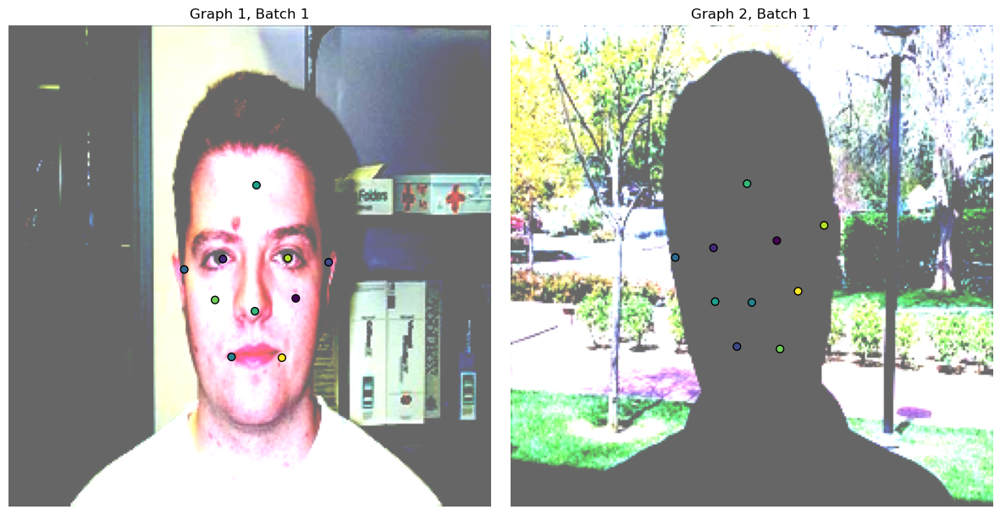

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


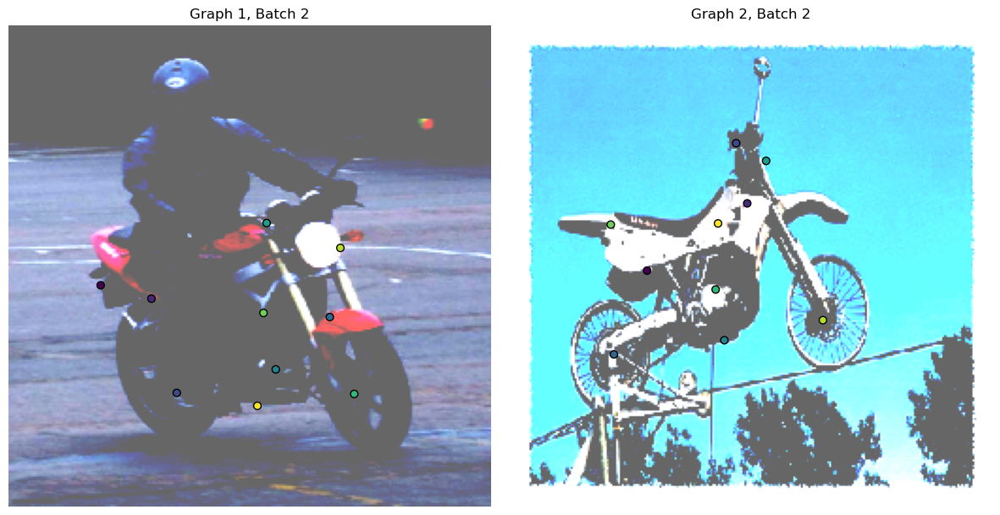

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


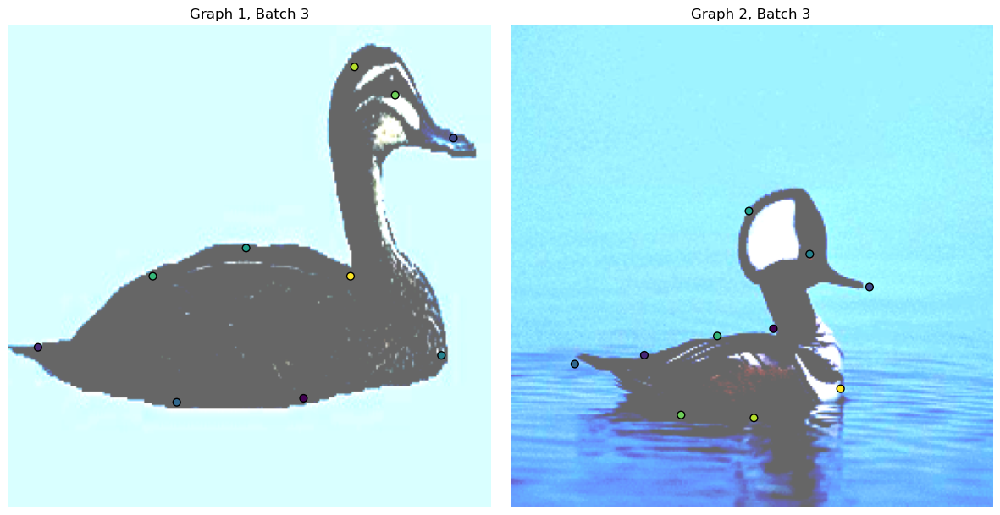

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


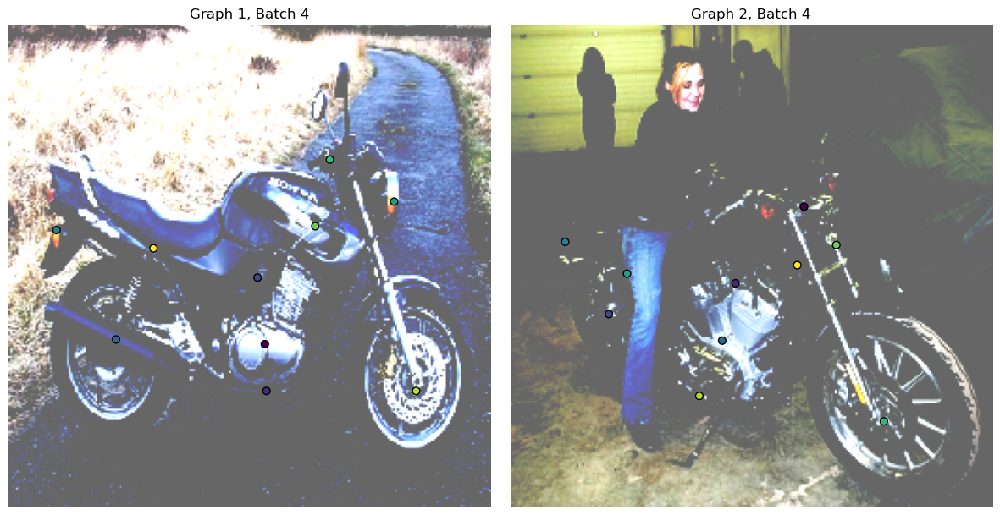

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


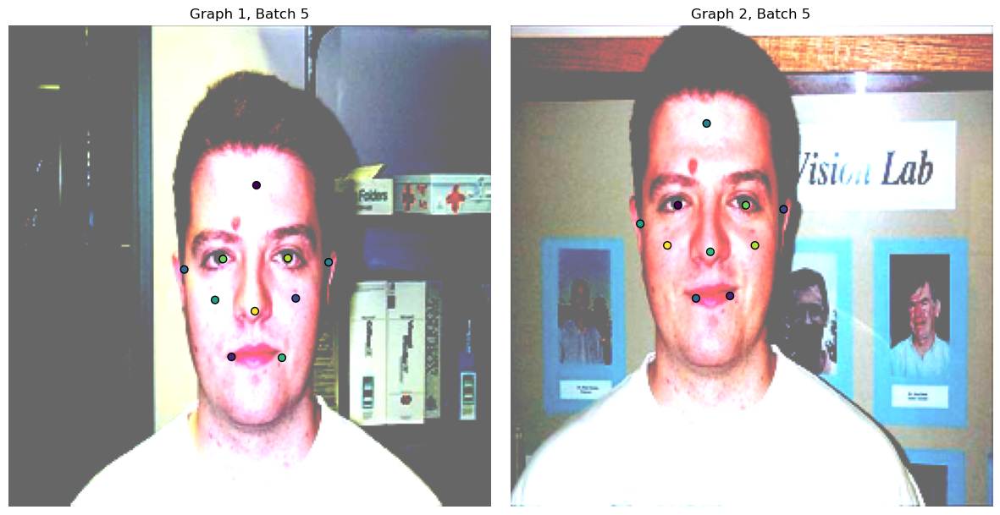

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


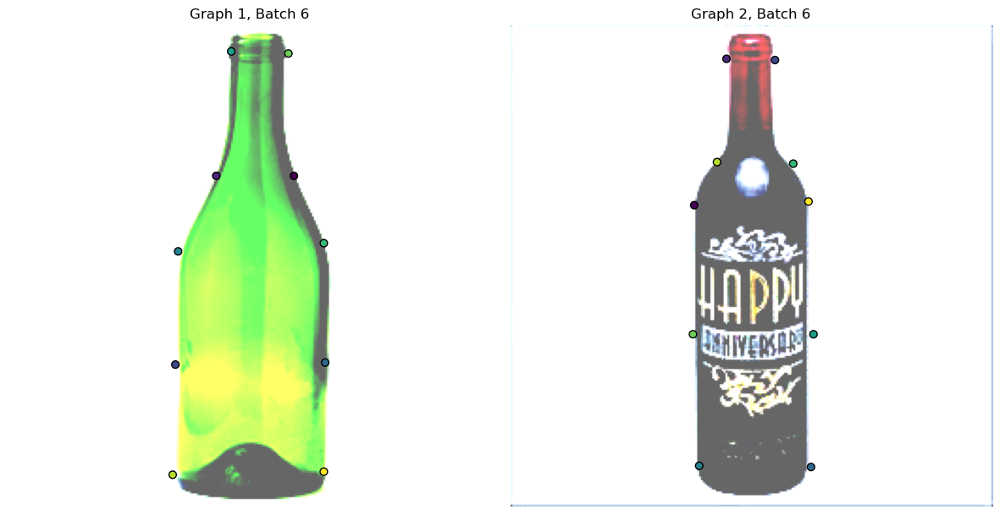

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


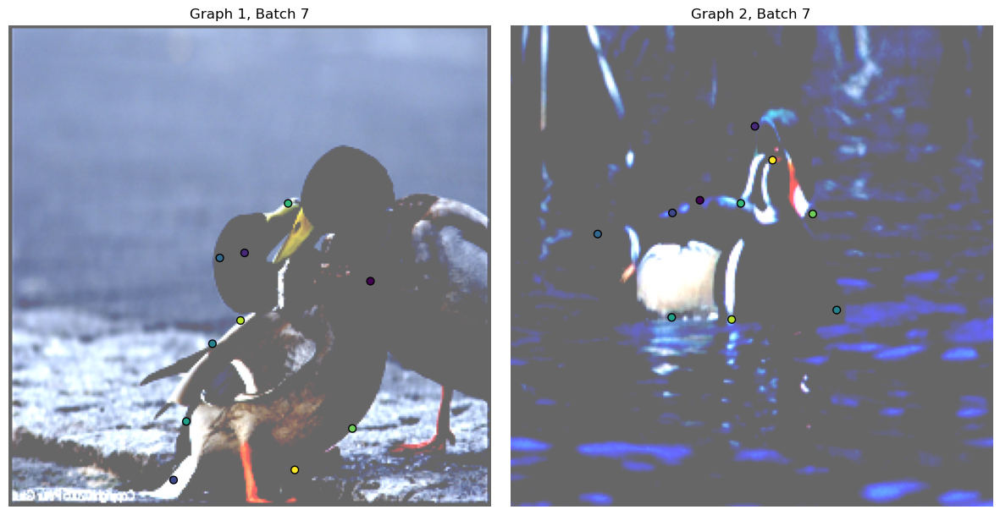

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


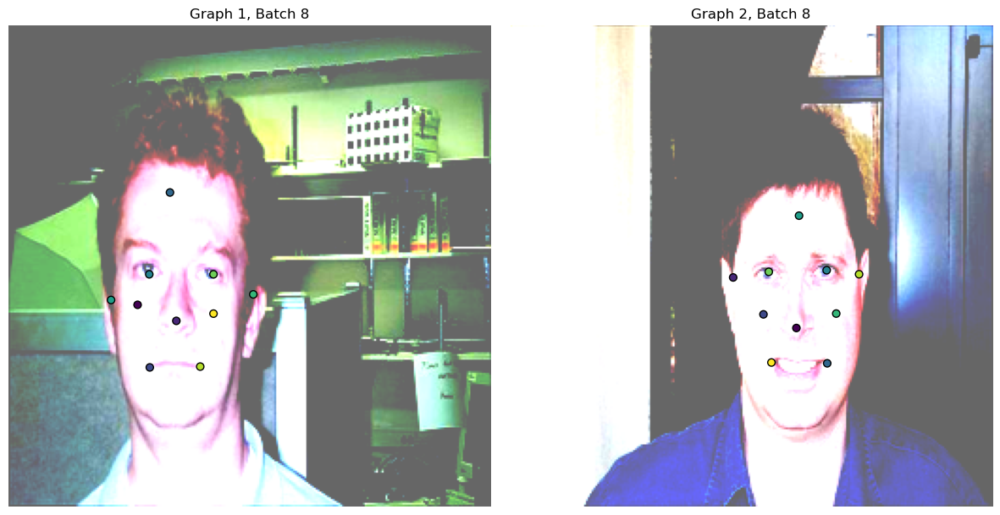

In [6]:
# Extract Images and Keypoints from Batch
images = batch["images"]  # Shape: (k, B, C, H, W)

if isinstance(images, list):
    images = torch.stack(images)

keypoints_list = batch["Ps"]  # Shape: (k, B, N, 2)
visualize_keypoints(images, keypoints_list)

## Test DataLoader using PascalVOC dataset, BATCH_SIZE=8, NUM_GRAPH=3

In [7]:
cfg_multi_graph = dict()

with open("./experiments/voc_basic_data.json") as f:
    cfg_multi_graph = json.load(f)

cfg_multi_graph = dict_to_easydict(cfg_multi_graph)
print(cfg_multi_graph)

{'BATCH_SIZE': 8, 'DATASET_NAME': 'PascalVOC', 'exclude_willow_classes': False, 'EVAL': {'SAMPLES': 1000, 'num_graphs_in_matching_instance': 3}, 'SPLINE_CNN': {'input_features': 1024, 'output_features': 648}, 'Matching_TF': {'n_head': 12, 'n_encoder': 4, 'n_decoder': 4, 'd_model': 648, 'nGPT_mlp_hidden_mult': 6, 'activation': 'relu', 'batch_norm': True, 'global_feat': True, 'pos_encoding': False, 'n_lap_EigVec': 8}, 'train_sampling': 'intersection', 'eval_sampling': 'intersection', 'save_checkpoint': True, 'RANDOM_SEED': 123, 'warmstart_path': None, 'TRAIN': {'EPOCH_ITERS': 2000, 'LR': 0.0005, 'lr_schedule': 'long_halving4', 'clip_norm': 0, 'weight_decay': 0, 'num_graphs_in_matching_instance': 3, 'random_swap': False, 'AR': True, 'temperature': 0.1, 'rince_q': 0.5, 'rince_lambda': 0.025}, 'STATISTIC_STEP': 1, 'TRACK_GRAD_NORM': False, 'visualize': False, 'visualization_params': {'reduced_vis': True}, 'evaluate_only': False, 'model_dir': './results/voc_basic/matchAR_corrected_mask', 'lo

In [8]:
dataset_len_multi = {"train": cfg_multi_graph.TRAIN.EPOCH_ITERS * cfg_multi_graph.BATCH_SIZE, "test": cfg_multi_graph.EVAL.SAMPLES * world_size} 
image_dataset_multi = {
    x: GMDataset(cfg_multi_graph.DATASET_NAME, sets=x, length=dataset_len_multi[x], obj_resize=(256, 256)) for x in ("train", "test")
}

print(image_dataset_multi["train"].name)

image_dataset_multi["train"].set_num_graphs(cfg_multi_graph.TRAIN.num_graphs_in_matching_instance)
image_dataset_multi["test"].set_num_graphs(cfg_multi_graph.EVAL.num_graphs_in_matching_instance)

dataloader_multi = {x: get_dataloader(image_dataset_multi[x],None, fix_seed=(x == "test")) for x in ("train", "test")}

Caching xml list to data\cache\voc_db_train.pkl...
Filtered 18553 images to 7020. Annotation saved.
TRUE EPOCHS:  False
16000
Initializing train-set. Randomly sampling 16000 examples.
Caching xml list to data\cache\voc_db_test.pkl...
Filtered 4645 images to 1682. Annotation saved.
TRUE EPOCHS:  False
0
Initializing test-set. Randomly sampling 0 examples.
PascalVOC


In [9]:
print("Num Graphs Set in Train Dataset: ", image_dataset_multi["train"].num_graphs_in_matching_instance)
print("Num Graphs Set in Test Dataset: ", image_dataset_multi["test"].num_graphs_in_matching_instance)

Num Graphs Set in Train Dataset:  3
Num Graphs Set in Test Dataset:  3


In [12]:
for batch_multi in dataloader_multi["train"]:
    print("Keys in batch:", batch_multi.keys())  # Check available keys
    print("Number of graphs in batch:", len(batch_multi["edges"]))  # Check graph count
    print("Ground Truth Permutation Matrices:", batch_multi["gt_perm_mat"])
    print("Ground Truth Permutation Matrix Shape: ", batch_multi["gt_perm_mat"][0].shape)
    break  # Only process the first batch

Keys in batch: dict_keys(['Ps', 'ns', 'gt_perm_mat', 'edges', 'images'])
Number of graphs in batch: 3
Ground Truth Permutation Matrices: [tensor([[[0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 1.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         ...,
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.]],

        [[0., 0., 0.,  ..., 0., 0., 0.],
         [0., 1., 0.,  ..., 0., 0., 0.],
         [0., 0., 1.,  ..., 0., 0., 0.],
         ...,
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.]],

        [[0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         ...,
         [0., 0., 0.,  ..., 0., 0., 1.],
         [0., 0., 1.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.]],

        ...,

        [[1., 0., 0.,  ..., 0., 0., 0.],
         [0., 1., 0.,

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


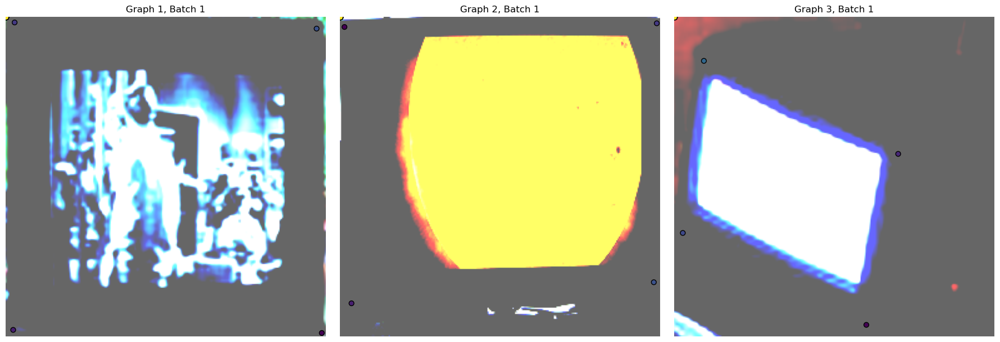

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


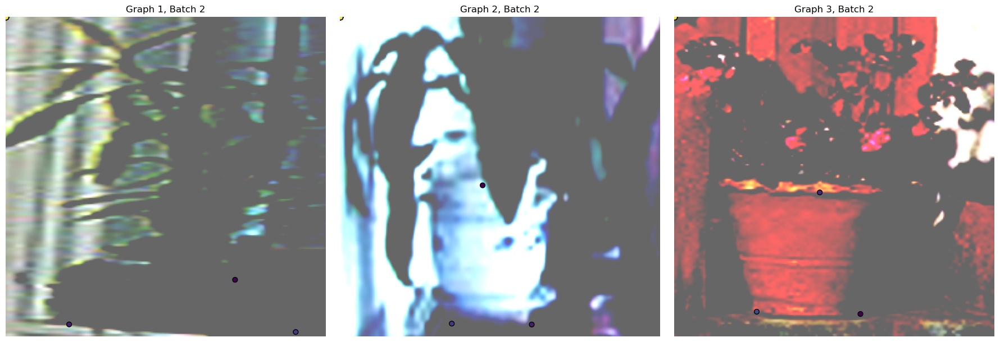

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


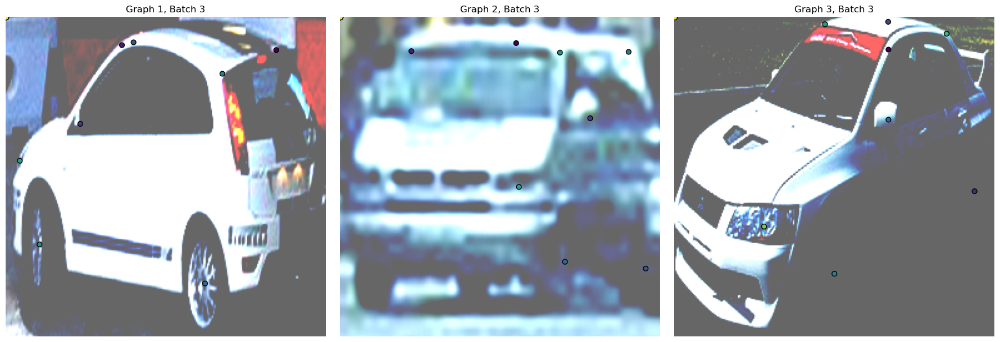

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


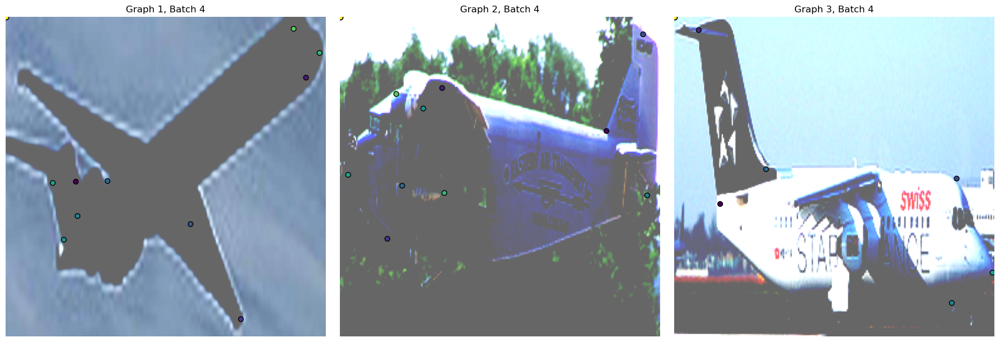

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


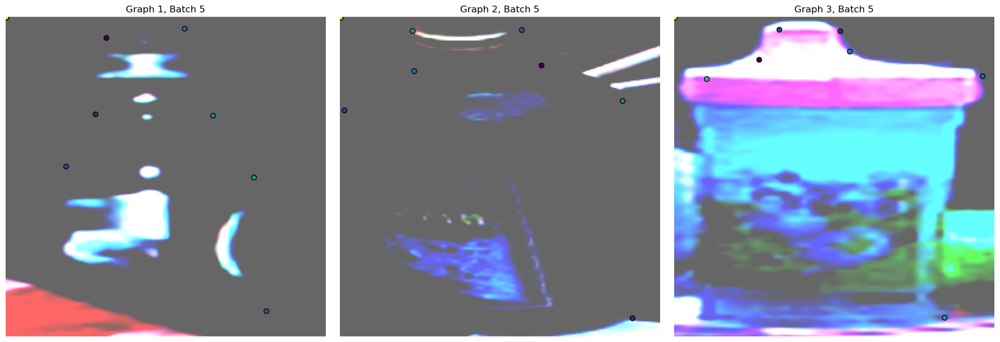

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


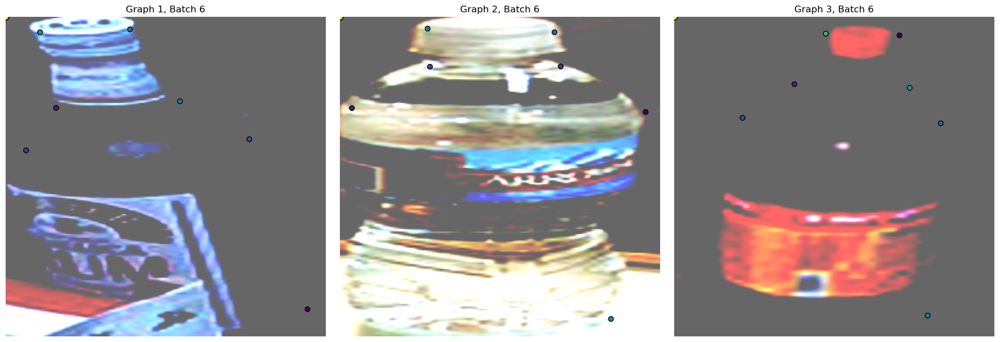

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


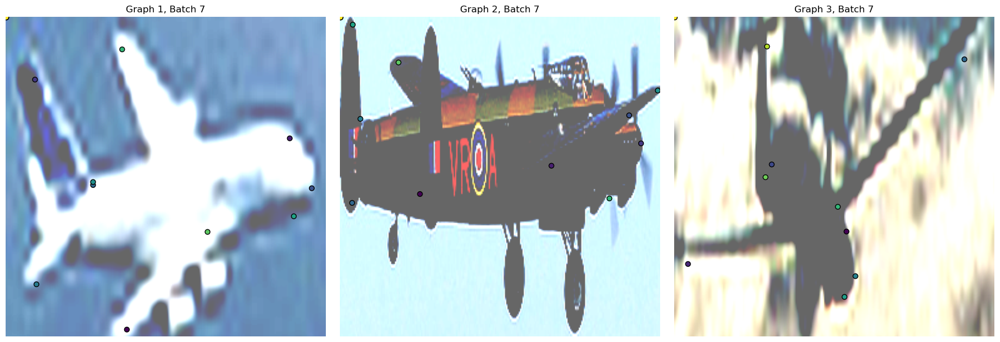

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


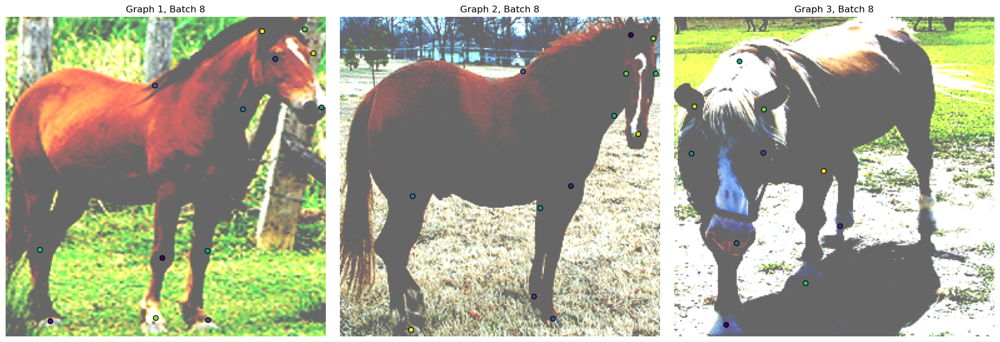

In [11]:
images_voc11 = batch_multi["images"]

if isinstance(images_voc11, list):
    images_voc11 = torch.stack(images_voc11)

keypoints_multi = batch_multi["Ps"]
visualize_keypoints(images_voc11, keypoints_multi)